In [ ]:
!git clone https://github.com/YoungSean/NIDS-Net.git

Cloning into 'NIDS-Net'...
remote: Enumerating objects: 559, done.
remote: Counting objects: 100% (110/110), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 559 (delta 63), reused 82 (delta 42), pack-reused 449 (from 1)
Receiving objects: 100% (559/559), 103.94 MiB | 17.83 MiB/s, done.
Resolving deltas: 100% (241/241), done.


In [ ]:
%cd NIDS-Net/

/content/NIDS-Net


In [ ]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.0/43.0 kB 2.0 MB/s eta 0:00:00


In [ ]:
!python setup.py install

I0828 08:24:57.983131 139425334997632 dist.py:986] running install
/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/cmd.py:66: SetuptoolsDeprecationWarning: setup.py install is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` directly.
        Instead, use pypa/build, pypa/installer or other
        standards-based tools.

        See https://blog.ganssle.io/articles/2021/10/setup-py-deprecated.html for details.
        ********************************************************************************

!!
  self.initialize_options()
I0828 08:24:58.037527 139425334997632 dist.py:986] running build
I0828 08:24:58.037704 139425334997632 dist.py:986] running build_py
I0828 08:24:58.060435 139425334997632 dir_util.py:70] creating build
I0828 08:24:58.060652 139425334997632 dir_util.py:70] creating build/lib
I0828 08:24:58.060832 139425334997632 dir_util.py:70] creating build/lib/data

In [ ]:
!python -m pip -q install 'git+https://github.com/facebookresearch/detectron2.git'

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 67.1 MB/s eta 0:00:00


In [ ]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!mkdir ckpts/sam_weights
!mv sam_vit_h_4b8939.pth ckpts/sam_weights

--2024-08-28 08:32:32--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.227.219.10, 13.227.219.70, 13.227.219.59, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.227.219.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   223MB/s    in 11s     

2024-08-28 08:32:43 (232 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [ ]:
!pip install -q numpy==1.26.1 supervision==0.18.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.2/61.2 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 58.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 8.8 MB/s eta 0:00:00


Check if the grouned-sam work

final text_encoder_type: bert-base-uncased
Model loaded from C:\Users\divya\.cache\huggingface\hub\models--ShilongLiu--GroundingDINO\snapshots\a94c9b567a2a374598f05c584e96798a170c56fb\groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


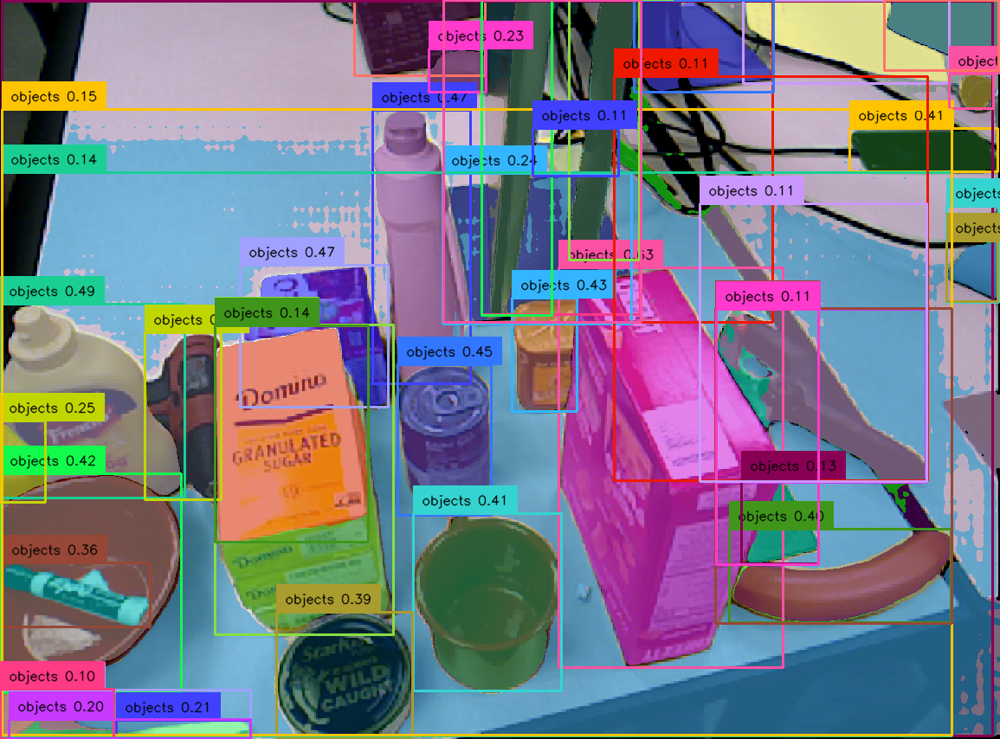

In [1]:
from absl import app, logging
from PIL import Image as PILImg
from robokit.utils import annotate, overlay_masks
from robokit.ObjDetection import GroundingDINOObjectPredictor, SegmentAnythingPredictor
from IPython.display import display

def test_gsam(image_path):
    # Path to the input image
    text_prompt = 'objects'

    try:
        logging.info("Initialize object detectors")
        gdino = GroundingDINOObjectPredictor()
        SAM = SegmentAnythingPredictor()

        logging.info("Open the image and convert to RGB format")
        image_pil = PILImg.open(image_path).convert("RGB")

        logging.info("GDINO: Predict bounding boxes, phrases, and confidence scores")
        bboxes, phrases, gdino_conf = gdino.predict(image_pil, text_prompt)

        logging.info("GDINO post processing")
        w, h = image_pil.size # Get image width and height
        # Scale bounding boxes to match the original image size
        image_pil_bboxes = gdino.bbox_to_scaled_xyxy(bboxes, w, h)

        logging.info("SAM prediction")
        image_pil_bboxes, masks = SAM.predict(image_pil, image_pil_bboxes)

        logging.info("Annotate the scaled image with bounding boxes, confidence scores, and labels, and display")
        bbox_annotated_pil = annotate(overlay_masks(image_pil, masks), image_pil_bboxes, gdino_conf, phrases)

        display(bbox_annotated_pil)

    except Exception as e:
        # Handle unexpected errors
        print(f"An unexpected error occurred: {e}")

test_gsam('imgs/clutter-test.png')

Note: first download our template embeddings of the high-resolution dataset to run the following scripts.

The location of template embeddings is supposed to be "./obj_FFA/object_features_vitl14_reg.json"

In [ ]:
import locale

locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!mkdir obj_FFA

In [ ]:
!wget https://utdallas.box.com/shared/static/50a8q7i5hc33rovgyavoiw0utuduno39 -O obj_FFA/object_features_vitl14_reg.json

--2024-08-28 08:35:19--  https://utdallas.box.com/shared/static/50a8q7i5hc33rovgyavoiw0utuduno39
Resolving utdallas.box.com (utdallas.box.com)... 74.112.186.157
Connecting to utdallas.box.com (utdallas.box.com)|74.112.186.157|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/50a8q7i5hc33rovgyavoiw0utuduno39 [following]
--2024-08-28 08:35:19--  https://utdallas.box.com/public/static/50a8q7i5hc33rovgyavoiw0utuduno39
Reusing existing connection to utdallas.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://utdallas.app.box.com/public/static/50a8q7i5hc33rovgyavoiw0utuduno39 [following]
--2024-08-28 08:35:20--  https://utdallas.app.box.com/public/static/50a8q7i5hc33rovgyavoiw0utuduno39
Resolving utdallas.app.box.com (utdallas.app.box.com)... 74.112.186.157
Connecting to utdallas.app.box.com (utdallas.app.box.com)|74.112.186.157|:443... connected.
HTTP request sent, awaiting response... 302 Foun

If you are using GPU, there can be a visual result.

In [3]:
#!/usr/bin/env python
# coding: utf-8


# Testing:
# 1. Object Proposal Generation by Grounded SAM
# 2. Feature Extraction for proposals by DINOv2
# 3. Proposal/Instance Matching -- Stable Matching

# In[6]:

import time
import argparse
import cv2
import glob
import json
import logging
import os
import sys
import random
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Optional

import torch
from torch import nn
import torch.backends.cudnn as cudnn
from torchvision import transforms as pth_transforms
import torchvision.transforms as T

sys.path.append("../detectron2")
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances


# sys.path.append("../dinov2-main")
# from dinov2.eval.setup import get_args_parser as get_setup_args_parser


sys.path.append(".")
from utils.visualizer import ColorMode, Visualizer
from utils.instance_det_dataset import RealWorldDataset
from utils.inference_utils import compute_similarity, stableMatching, get_bbox_masks_from_gdino_sam, \
    get_object_proposal, getColor, create_instances, nms, apply_nms, get_features
from tqdm import trange
from adapter import ModifiedClipAdapter, WeightAdapter
from utils.img_utils import get_masked_image

# logger = logging.getLogger("dinov2")


def get_args_parser(
        description: Optional[str] = None,
        parents: Optional[List[argparse.ArgumentParser]] = [],
        add_help: bool = True,
):
    #setup_args_parser = get_setup_args_parser(parents=parents, add_help=False)
    parents = []

    parser = argparse.ArgumentParser(
        description=description,
        parents=parents,
        add_help=add_help,
    )
    parser.add_argument(
        "--train_path",
        default="../database/train",
        type=str,
        help="Path to train dataset.",
    )
    parser.add_argument(
        "--test_path",
        default="../database/test",
        type=str,
        help="Path to test dataset.",
    )
    parser.add_argument(
        "--imsize",
        default=448,
        type=int,
        help="Image size",
    )
    parser.add_argument(
        "--output_dir",
        default="./output",
        type=str,
        help="Path to save outputs.")
    parser.add_argument("--num_workers", default=0, type=int, help="Number of data loading workers per GPU.")

    parser.add_argument(
        "--gather-on-cpu",
        action="store_true",
        help="Whether to gather the train features on cpu, slower"
             "but useful to avoid OOM for large datasets (e.g. ImageNet22k).",
    )

    parser.set_defaults(
        train_dataset="Object",
        test_dataset="Scene",
        batch_size=1,
        num_workers=0,
    )
    return parser


# In[8]:


# Default args and initialize model
args_parser = get_args_parser(description="Grounded SAM-DINOv2 Instance Detection")
imsize = 448
tag = "mask"  # bbox
img_id = 39
args = args_parser.parse_args(args=["--train_path", "database/Objects",
                                    "--test_path", "test_data/test_1/test_"+str(img_id).zfill(3)+".jpg",  # test_002
                                    "--output_dir", "exps/demo0501_" + str(imsize) + "_" + tag,
                                    ])
os.makedirs(args.output_dir, exist_ok=True)


# use dino v2 to extract features
encoder = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14_reg')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
encoder.to(device)
encoder.eval()

# Assuming the model's architecture is defined in 'FeatureVectorModel' class
use_adapter = False
adapter_type = "weight"
if use_adapter:
    input_features = 1024
    if adapter_type == "clip":
        adapter_args = 'Ins_ratio_0.6_temp_0.05_epoch_40_lr_0.001_bs_1024_vec_reduction_4_L2e4_vitl_reg'
        model_path = 'adapter_weights/adapter2FC/'+adapter_args+'_weights.pth'
        adapter = ModifiedClipAdapter(input_features, reduction=4, ratio=0.6).to('cuda')
    elif adapter_type == "weight":
        adapter_args = 'Ins_weighted_10sigmoid_ratio_0.6_temp_0.05_epoch_40_lr_0.001_bs_1024_vec_reduction_4_L2e4_vitl_reg'
        model_path = 'adapter_weights/adapter2FC/' + adapter_args + '_weights.pth'
        adapter = WeightAdapter(input_features, reduction=4).to('cuda')

    # Load the weights
    adapter.load_state_dict(torch.load(model_path))

    # If you plan to only evaluate the model, switch to eval mode
    adapter.eval()

    print('Model weights loaded and model is set to evaluation mode.')



# In[9]:

output_dir = 'D:/CODE/NIDS-Net/feats'
json_filename = 'high_resolution_object_features_vitl14_reg.json'
# json_filename = "object_features_l_reg_class.json"
if use_adapter:
    output_dir = './adapted_obj_feats'
    json_filename = adapter_args+'.json'


with open(os.path.join(output_dir, json_filename), 'r') as f:
    feat_dict = json.load(f)


object_features = torch.Tensor(feat_dict['features']).to(device)
object_features = nn.functional.normalize(object_features, dim=1, p=2)
print("object_features: ", object_features.shape)


Using cache found in C:\Users\divya/.cache\torch\hub\facebookresearch_dinov2_main


object_features:  torch.Size([2400, 1024])


In [5]:
# In[10]:
from absl import app, logging
from PIL import Image as PILImg


from robokit.ObjDetection import GroundingDINOObjectPredictor, SegmentAnythingPredictor

# Path to the input image
image_path = args.test_path


logging.info("Initialize object detectors")
gdino = GroundingDINOObjectPredictor(use_vitb=False, box_threshold=0.15, text_threshold=0.15)
SAM = SegmentAnythingPredictor(vit_model="vit_h")

logging.info("Open the image and convert to RGB format")
image_pil = PILImg.open(image_path).convert("RGB")

# #### 1. Get object proposals with Grounded-SAM
accurate_bboxs, masks = get_bbox_masks_from_gdino_sam(image_path, gdino, SAM, text_prompt='objects', visualize=False)


final text_encoder_type: bert-base-uncased
Model loaded from C:\Users\divya\.cache\huggingface\hub\models--ShilongLiu--GroundingDINO\snapshots\a94c9b567a2a374598f05c584e96798a170c56fb\groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [6]:
start_time = time.time()
scene_features_list = []
proposals_list = []
scene_name_list = []
mask = masks.cpu().numpy()
accurate_bboxs = accurate_bboxs.cpu().numpy()
scene_name = os.path.basename(image_path).split('.')[0]
scene_name_list.append(scene_name)
rois, sel_rois, cropped_imgs, cropped_masks = get_object_proposal(args.test_path, accurate_bboxs, masks, tag=tag, ratio=0.25, save_rois=False, output_dir=args.output_dir, save_proposal=False)
scene_features = []
len(sel_rois), len(cropped_imgs), len(cropped_masks)

NameError: name 'masks' is not defined

In [ ]:

# #### 2. Crop proposals from the high-resolution version

# In[11]:

for i in trange(len(cropped_imgs)):
    img = cropped_imgs[i]
    mask = cropped_masks[i]
    ffa_feature= get_features([img], [mask], encoder,device=device, img_size=imsize)

    # fig, ax = plt.subplots(1, 2, figsize=(10, 20))
    # ax[0].imshow(og_img)
    # ax[1].imshow(feats[0, :3].permute(1, 2, 0).detach().cpu())
    # plt.tight_layout()
    # plt.show()

    with torch.no_grad():
        if use_adapter:
            ffa_feature = adapter(ffa_feature)
    scene_features.append(ffa_feature)
scene_features = torch.cat(scene_features, dim=0)
scene_features = nn.functional.normalize(scene_features, dim=1, p=2)

scene_features_list.append(scene_features)
# total_proposals[scene_name] = sel_rois
proposals_list.append(sel_rois)

Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_reg4_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_reg4_pretrain.pth
100%|██████████| 1.13G/1.13G [00:04<00:00, 256MB/s]


object_features:  torch.Size([2400, 1024])
final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


100%|██████████| 36/36 [00:09<00:00,  3.97it/s]


Total running time: 11.503978490829468 seconds
Done!
Done!
	 22
	 6
	 21
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.450
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.625
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.500
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.467
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.500
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.450
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] 

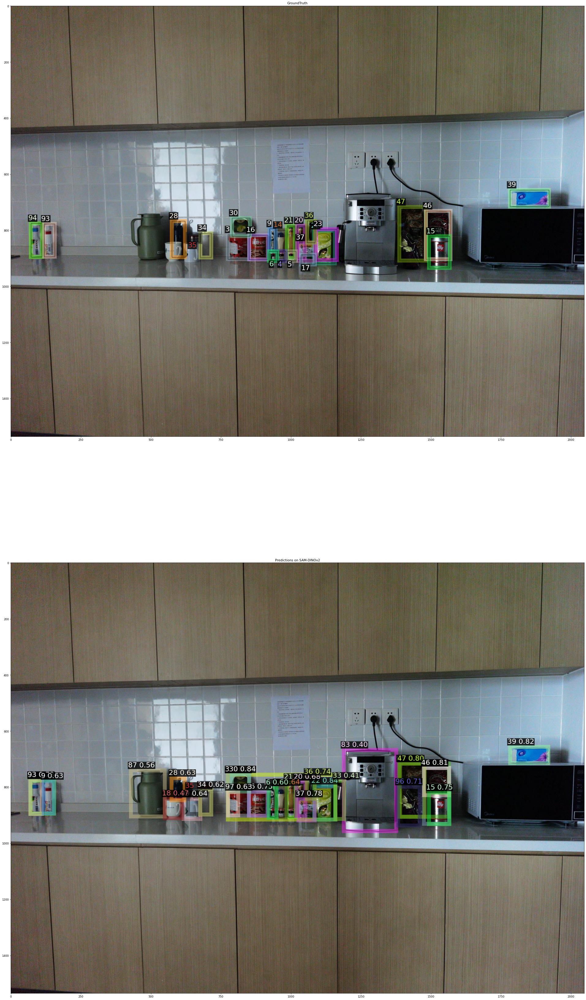

In [ ]:

# rgb_normalize = T.Compose(
#             [
#                 T.ToTensor(),
#                 T.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#             ]
#         )
# masks = masks.squeeze(1).to(torch.float32)
# rois, sel_rois, cropped_imgs, cropped_masks = get_object_proposal_tensor(args.test_path, accurate_bboxs, masks, img_size=448, rgb_normalize=rgb_normalize,tag=tag, ratio=0.25, save_rois=True, output_dir=args.output_dir)
# scene_features = []
#

# batch_size = 32  # Define the batch size
#
# dataset = TensorDataset(cropped_imgs, cropped_masks)
# # Create a DataLoader
# data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
#
# # Iterate over the DataLoader
# for image_batch, mask_batch in data_loader:
#     ffa_feature = get_features_via_batch_tensor(image_batch, mask_batch, encoder, img_size=imsize)
#     if use_adapter:
#         ffa_feature = adapter(ffa_feature)
#     # Extend the main feature list with the features from this batch
#     scene_features.append(ffa_feature)
# scene_features = torch.cat(scene_features, dim=0)
# scene_features = nn.functional.normalize(scene_features, dim=1, p=2)
# Capture the end time
end_time = time.time()

# Calculate and print the total time
print(f"Total running time: {end_time - start_time} seconds")

# image_height, image_width = raw_image.shape[:-1]
scene_name = os.path.basename(args.test_path).split('.')[0]



# In[13]:


# transform = pth_transforms.Compose([pth_transforms.ToTensor(),])
#
# # for demo
# scene_dataset = RealWorldDataset(args.output_dir, scene_name, data=rois, transform=transform, imsize=args.imsize)
# scene_features = get_scene_feature(args.output_dir, scene_name, scene_dataset, model, args.batch_size, args.num_workers)


# ####  3. Compute Cosine Similarity and Proposal/Instance Matching

# In[7]:

# reshape scene feature matrix
# scene_cnt = [0, *scene_dataset.cfg['length']]
# scene_idx = [sum(scene_cnt[:i + 1]) for i in range(len(scene_cnt))]
# scene_features_list = [scene_features[scene_idx[i]:scene_idx[i + 1]] for i in
#                         range(len(scene_dataset.cfg['length']))]
#
# proposals = scene_dataset.cfg['proposals']
# proposals_list = [proposals[scene_idx[i]:scene_idx[i + 1]] for i in range(len(scene_dataset.cfg['length']))]

def calculate_area(bbox):
    x1, y1, x2, y2 = bbox
    return (x2 - x1) * (y2 - y1)

num_object = 100 # len(object_dataset.cfg['obj_name'])
num_example = len(object_features) // num_object

results = []

for idx, scene_feature in enumerate(scene_features_list):
    sim_mat = compute_similarity(object_features, scene_feature)
    sim_mat = sim_mat.view(len(scene_feature), num_object, num_example)
    sims, _ = torch.max(sim_mat, dim=2)  # choose max score over profile examples of each object instance
    max_ins_sim, initial_result = torch.max(sims, dim=1)

    proposals = proposals_list[idx]
    num_proposals = len(proposals)

    ########################################## Stable Matching Strategy ##########################################
    do_matching = True
    if do_matching:
        # ------------ ranking and sorting ------------
        # Initialization
        sel_obj_ids = [str(v) for v in list(np.arange(num_object))]  # ids for selected obj
        sel_roi_ids = [str(v) for v in list(np.arange(len(scene_feature)))]  # ids for selected roi

        # Padding
        max_len = max(len(sel_roi_ids), len(sel_obj_ids))
        sel_sims_symmetric = torch.ones((max_len, max_len)) * -1
        sel_sims_symmetric[:len(sel_roi_ids), :len(sel_obj_ids)] = sims.clone()

        pad_len = abs(len(sel_roi_ids) - len(sel_obj_ids))
        if len(sel_roi_ids) > len(sel_obj_ids):
            pad_obj_ids = [str(i) for i in range(num_object, num_object + pad_len)]
            sel_obj_ids += pad_obj_ids
        elif len(sel_roi_ids) < len(sel_obj_ids):
            pad_roi_ids = [str(i) for i in range(len(sel_roi_ids), len(sel_roi_ids) + pad_len)]
            sel_roi_ids += pad_roi_ids

        # ------------ stable matching ------------
        matchedMat = stableMatching(
            sel_sims_symmetric.detach().data.cpu().numpy())  # predMat is raw predMat
        predMat_row = np.zeros_like(
            sel_sims_symmetric.detach().data.cpu().numpy())  # predMat_row is the result after stable matching
        Matches = dict()
        for i in range(matchedMat.shape[0]):
            tmp = matchedMat[i, :]
            a = tmp.argmax()
            predMat_row[i, a] = tmp[a]
            Matches[sel_roi_ids[i]] = sel_obj_ids[int(a)]
        print("Done!")

        # ------------ thresholding ------------
        preds = Matches.copy()
        # for key, value in Matches.items():
        #     if sel_sims_symmetric[int(sel_roi_ids.index(key)), int(sel_obj_ids.index(value))] <= score_thresh_predefined:
        #         del preds[key]
        #         continue

        # ------------ save per scene results ------------

        for k, v in preds.items():
            if int(k) >= num_proposals:  # since the number of proposals is less than the number of object features
                break

            result = dict()
            result['image_id'] = proposals[int(k)]['image_id']
            result['category_id'] = int(v)
            result['bbox'] = proposals[int(k)]['bbox']
            result['score'] = float(sims[int(k), int(v)])
            result['area'] = calculate_area(proposals[int(k)]['bbox'])
            result['image_width'] = proposals[int(k)]['image_width']
            result['image_height'] = proposals[int(k)]['image_height']
            result['scale'] = proposals[int(k)]['scale']
            results.append(result)
    else:
        THRESHOLD_OBJECT_SCORE = 0.6
        for i in range(num_proposals):
            if float(max_ins_sim[i]) < THRESHOLD_OBJECT_SCORE:
                continue
            result = dict()
            result['image_id'] = proposals[i]['image_id']
            result['category_id'] = initial_result[i].item()
            result['bbox'] = proposals[i]['bbox']
            result['score'] = float(max_ins_sim[i])
            result['area'] = calculate_area(proposals[i]['bbox'])
            result['image_width'] = proposals[i]['image_width']
            result['image_height'] = proposals[i]['image_height']
            result['scale'] = proposals[i]['scale']
            results.append(result)


    # print("Done!")


# ### Save Results

# In[8]:


# save final results
with open(os.path.join(args.output_dir, "coco_instances_results.json"), "w") as f:
    json.dump(results, f)

predictions = dict(
    [(k, {'image_id': -1, 'instances': []}) for k in range(len(scene_name_list))])
for idx in range(len(results)):
    id = results[idx]['image_id']
    predictions[scene_name_list.index('test_' + str(id).zfill(3))]['image_id'] = id

    predictions[scene_name_list.index('test_' + str(id).zfill(3))]['instances'].append(results[idx])

torch.save(predictions, os.path.join(args.output_dir, "instances_predictions.pth"))

print('Done!')


# ### Visualization

# In[9]:

# Random custom colors with a fixed random seed
random.seed(77)
thing_colors = []
for i in range(100):
    thing_colors.append(getColor())


# In[10]:


# Register Test Data for COCO evaluation
test_path = "./test_data/test_4" # 1 for raw data, 2 for ratio=0.5, 4 for ratio=0.25, 8 for ratio=0.125  # test_4
# test_json = "./test_data/annotations/instances_test_4.json"  # instances_test_4
test_json = "./test_data/annotations/single_image_ground_truth_"+str(img_id)+".json"  # instances_test_4
register_coco_instances("coco_InsDet_test", {}, test_json, test_path)
MetadataCatalog.get("coco_InsDet_test").thing_colors = thing_colors


# In[11]:


pred_dir = os.path.join(args.output_dir,"predictions")
os.makedirs(pred_dir, exist_ok=True)
test_metadata = MetadataCatalog.get("coco_InsDet_test")
test_dataset_dicts = DatasetCatalog.get("coco_InsDet_test")

idx = scene_name_list.index(scene_name)
# d = test_dataset_dicts[int(scene_name.split('_')[-1])]
d = test_dataset_dicts[0] # idx
img = cv2.imread(d["file_name"])
base_name = os.path.basename(d["file_name"]).split(".")[0]

# visualize GT
visGT = Visualizer(img[:, :, ::-1],
                   metadata=test_metadata,
                   scale=1.0,
                   instance_mode=ColorMode.SEGMENTATION)
vis_gt = visGT.draw_dataset_dict(d)
cv2.imwrite(os.path.join(pred_dir, base_name + "_gt.jpg"),
            vis_gt.get_image()[:, :, ::-1])

# visualize pred
# predictions = torch.load(os.path.join(args.output_dir, "instances_predictions.pth"))
pred = create_instances(predictions[idx]['instances'], img.shape[:2], test_metadata)
keep_ids = apply_nms(pred)  # apply NMS

visPred = Visualizer(img[:, :, ::-1],
                     metadata=test_metadata,
                     scale=1.0,
                     instance_mode=ColorMode.SEGMENTATION)
vis_pred = visPred.draw_instance_predictions(pred.to("cpu"), keep_ids)
cv2.imwrite(os.path.join(pred_dir, base_name + "_pred_SAM+DINOv2.jpg"),
            vis_pred.get_image()[:, :, ::-1])

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Load the ground truth COCO dataset
cocoGt = COCO('test_data/annotations/single_image_ground_truth_'+str(img_id)+'.json')

# Load your detection results
cocoDt = cocoGt.loadRes(os.path.join(args.output_dir, "coco_instances_results.json"))

# Create a COCOeval object by initializing it with the ground truth and detection results
cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')

# Run the evaluation
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

# 'bbox' specifies that we are doing evaluation for bounding box detection.
# You can change it to 'segm' for segmentation tasks.


# In[12]:


fig = plt.figure(figsize=(30,60), dpi=64, facecolor='w', edgecolor='k')
ax = plt.subplot(211)
ax.set_title("GroundTruth")
plt.imshow(vis_gt.get_image()[:, :, :])
ax = plt.subplot(212)
ax.set_title("Predictions on SAM-DINOv2")
plt.imshow(vis_pred.get_image()[:, :, :])
plt.tight_layout()
# plt.savefig('./result_images/InsDet/'+base_name+'_SAM_DINOv2.png', dpi=300)
plt.show()

In [ ]:
results


[{'image_id': 39,
  'category_id': 52,
  'bbox': [1190, 669, 186, 289],
  'score': 0.3552118241786957,
  'area': 381520,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 79,
  'bbox': [1612, 713, 435, 211],
  'score': 0.27404695749282837,
  'area': 590854,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 93,
  'bbox': [70, 776, 41, 121],
  'score': 0.7271713018417358,
  'area': 18995,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 22,
  'bbox': [1083, 797, 75, 120],
  'score': 0.839997410774231,
  'area': 682416,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 15,
  'bbox': [1493, 821, 73, 112],
  'score': 0.7497627139091492,
  'area': 1006780,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 9,
  'bbox': [118, 780, 36, 115],
  'score': 0.63430112

In [ ]:
results